In [1]:
import numpy as np
import pandas as pd
import os
import math
import random 
import cv2 as cv

from scipy import stats #Analysis 
from scipy.stats import norm 

import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

1. Data Load
치매 예방을 위한 라이프로그 치매 분류

9,327 rows × 2 columns x 5 picture

For more details https://aihub.or.kr/problem_contest/nipa-learning-platform/6

In [2]:
# original data : data 

path = "./Dataset/pic_dataset"

FAST_RUN = False
IMAGE_WIDTH=34
IMAGE_HEIGHT=34
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=1

filenames = os.listdir(path)
categories = []
sobee = []

# data = cv.imread('/content/gdrive/My Drive/CoLab/Dataset/pic_dataset/CN_0.png', 0)
# img = cv.resize(data, None, fx=28/349, fy=28/231)
# print(img/255)
# print(img.shape)

for filename in filenames:
    category = filename.split('_')[0]
    categories.append(category)
#    if category == 'CN':
#        categories.append(0)
#    elif  category == 'MCI':
#        categories.append(1)
#    else:
#        categories.append(2)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

df

,filename,category
0,CN_0.png,CN
1,CN_1.png,CN
2,CN_10.png,CN
3,CN_1000.png,CN
4,CN_1001.png,CN
...,...,...
9322,MCI_95.png,MCI
9323,MCI_96.png,MCI
9324,MCI_97.png,MCI
9325,MCI_98.png,MCI


2. EDA
9,327 rows × 66 columns

148명에 대한 데일리 라이프로그 데이터
크게 1. 기본 정보 2. 걸음거리 3.수면 4.컨버팅 데이터로 나눌 수 있겠습니다.

4. converting

CONVERT(activity_class_5min USING utf8)
CONVERT(activity_met_1min USING utf8)
CONVERT(sleep_hr_5min USING utf8)
CONVERT(sleep_hypnogram_5min USING utf8)
CONVERT(sleep_rmssd_5min USING utf8)
y variable

DIAG_NM
정상(CN), 경도인지 장애(MCI), 치매(Dem)

In [3]:
df.shape

(9327, 2)

In [4]:
y_data = df['category'].copy()

In [5]:
for i in range(len(filenames)):
  mypath = path + '/' + filenames[i]
  print(mypath)
  data = cv.imread(mypath, 0)
  img = cv.resize(data, None, fx=28/349, fy=28/231)
  img = img/255
  sobee.append(img)

./Dataset/pic_dataset/CN_0.png
./Dataset/pic_dataset/CN_1.png
./Dataset/pic_dataset/CN_10.png
./Dataset/pic_dataset/CN_1000.png
./Dataset/pic_dataset/CN_1001.png
./Dataset/pic_dataset/CN_1002.png
./Dataset/pic_dataset/CN_1003.png
./Dataset/pic_dataset/CN_1004.png
./Dataset/pic_dataset/CN_1005.png
./Dataset/pic_dataset/CN_1006.png
./Dataset/pic_dataset/CN_1007.png
./Dataset/pic_dataset/CN_1008.png
./Dataset/pic_dataset/CN_1009.png
./Dataset/pic_dataset/CN_1010.png
./Dataset/pic_dataset/CN_1011.png
./Dataset/pic_dataset/CN_1012.png
./Dataset/pic_dataset/CN_1013.png
./Dataset/pic_dataset/CN_1014.png
./Dataset/pic_dataset/CN_1015.png
./Dataset/pic_dataset/CN_1016.png
./Dataset/pic_dataset/CN_1017.png
./Dataset/pic_dataset/CN_1018.png
./Dataset/pic_dataset/CN_1019.png
./Dataset/pic_dataset/CN_1020.png
./Dataset/pic_dataset/CN_1021.png
./Dataset/pic_dataset/CN_1022.png
./Dataset/pic_dataset/CN_1023.png
./Dataset/pic_dataset/CN_1024.png
./Dataset/pic_dataset/CN_1025.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/CN_1868.png
./Dataset/pic_dataset/CN_1869.png
./Dataset/pic_dataset/CN_187.png
./Dataset/pic_dataset/CN_1870.png
./Dataset/pic_dataset/CN_1871.png
./Dataset/pic_dataset/CN_1872.png
./Dataset/pic_dataset/CN_1873.png
./Dataset/pic_dataset/CN_1874.png
./Dataset/pic_dataset/CN_1875.png
./Dataset/pic_dataset/CN_188.png
./Dataset/pic_dataset/CN_189.png
./Dataset/pic_dataset/CN_19.png
./Dataset/pic_dataset/CN_190.png
./Dataset/pic_dataset/CN_191.png
./Dataset/pic_dataset/CN_192.png
./Dataset/pic_dataset/CN_193.png
./Dataset/pic_dataset/CN_194.png
./Dataset/pic_dataset/CN_195.png
./Dataset/pic_dataset/CN_196.png
./Dataset/pic_dataset/CN_197.png
./Dataset/pic_dataset/CN_198.png
./Dataset/pic_dataset/CN_199.png
./Dataset/pic_dataset/CN_2.png
./Dataset/pic_dataset/CN_20.png
./Dataset/pic_dataset/CN_200.png
./Dataset/pic_dataset/CN_201.png
./Dataset/pic_dataset/CN_2010.png
./Dataset/pic_dataset/CN_2011.png
./Dataset/pic_dataset/CN_2012.png
./Dataset/pic_dataset/CN_2013.png
./

./Dataset/pic_dataset/CN_2263.png
./Dataset/pic_dataset/CN_2264.png
./Dataset/pic_dataset/CN_2265.png
./Dataset/pic_dataset/CN_2266.png
./Dataset/pic_dataset/CN_2267.png
./Dataset/pic_dataset/CN_2268.png
./Dataset/pic_dataset/CN_2269.png
./Dataset/pic_dataset/CN_2270.png
./Dataset/pic_dataset/CN_2271.png
./Dataset/pic_dataset/CN_2272.png
./Dataset/pic_dataset/CN_2273.png
./Dataset/pic_dataset/CN_2274.png
./Dataset/pic_dataset/CN_2275.png
./Dataset/pic_dataset/CN_2276.png
./Dataset/pic_dataset/CN_2277.png
./Dataset/pic_dataset/CN_2278.png
./Dataset/pic_dataset/CN_2279.png
./Dataset/pic_dataset/CN_2280.png
./Dataset/pic_dataset/CN_2281.png
./Dataset/pic_dataset/CN_2282.png
./Dataset/pic_dataset/CN_2283.png
./Dataset/pic_dataset/CN_2284.png
./Dataset/pic_dataset/CN_2285.png
./Dataset/pic_dataset/CN_2286.png
./Dataset/pic_dataset/CN_2287.png
./Dataset/pic_dataset/CN_2288.png
./Dataset/pic_dataset/CN_2289.png
./Dataset/pic_dataset/CN_2290.png
./Dataset/pic_dataset/CN_2291.png
./Dataset/pic_

./Dataset/pic_dataset/CN_2515.png
./Dataset/pic_dataset/CN_2516.png
./Dataset/pic_dataset/CN_2517.png
./Dataset/pic_dataset/CN_2518.png
./Dataset/pic_dataset/CN_2519.png
./Dataset/pic_dataset/CN_2520.png
./Dataset/pic_dataset/CN_2521.png
./Dataset/pic_dataset/CN_2522.png
./Dataset/pic_dataset/CN_2523.png
./Dataset/pic_dataset/CN_2524.png
./Dataset/pic_dataset/CN_2525.png
./Dataset/pic_dataset/CN_2526.png
./Dataset/pic_dataset/CN_2527.png
./Dataset/pic_dataset/CN_2528.png
./Dataset/pic_dataset/CN_2529.png
./Dataset/pic_dataset/CN_2530.png
./Dataset/pic_dataset/CN_2531.png
./Dataset/pic_dataset/CN_2532.png
./Dataset/pic_dataset/CN_2533.png
./Dataset/pic_dataset/CN_2534.png
./Dataset/pic_dataset/CN_2535.png
./Dataset/pic_dataset/CN_2536.png
./Dataset/pic_dataset/CN_2537.png
./Dataset/pic_dataset/CN_2538.png
./Dataset/pic_dataset/CN_2539.png
./Dataset/pic_dataset/CN_2540.png
./Dataset/pic_dataset/CN_2541.png
./Dataset/pic_dataset/CN_2542.png
./Dataset/pic_dataset/CN_2543.png
./Dataset/pic_

./Dataset/pic_dataset/CN_2755.png
./Dataset/pic_dataset/CN_2756.png
./Dataset/pic_dataset/CN_2757.png
./Dataset/pic_dataset/CN_2758.png
./Dataset/pic_dataset/CN_2759.png
./Dataset/pic_dataset/CN_276.png
./Dataset/pic_dataset/CN_2760.png
./Dataset/pic_dataset/CN_2761.png
./Dataset/pic_dataset/CN_2762.png
./Dataset/pic_dataset/CN_2763.png
./Dataset/pic_dataset/CN_2764.png
./Dataset/pic_dataset/CN_2765.png
./Dataset/pic_dataset/CN_2766.png
./Dataset/pic_dataset/CN_2767.png
./Dataset/pic_dataset/CN_2768.png
./Dataset/pic_dataset/CN_2769.png
./Dataset/pic_dataset/CN_277.png
./Dataset/pic_dataset/CN_2770.png
./Dataset/pic_dataset/CN_2771.png
./Dataset/pic_dataset/CN_2772.png
./Dataset/pic_dataset/CN_2773.png
./Dataset/pic_dataset/CN_2774.png
./Dataset/pic_dataset/CN_2775.png
./Dataset/pic_dataset/CN_2776.png
./Dataset/pic_dataset/CN_2777.png
./Dataset/pic_dataset/CN_2778.png
./Dataset/pic_dataset/CN_2779.png
./Dataset/pic_dataset/CN_278.png
./Dataset/pic_dataset/CN_2780.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_3209.png
./Dataset/pic_dataset/CN_321.png
./Dataset/pic_dataset/CN_3210.png
./Dataset/pic_dataset/CN_3211.png
./Dataset/pic_dataset/CN_3212.png
./Dataset/pic_dataset/CN_3213.png
./Dataset/pic_dataset/CN_3214.png
./Dataset/pic_dataset/CN_3215.png
./Dataset/pic_dataset/CN_3216.png
./Dataset/pic_dataset/CN_3217.png
./Dataset/pic_dataset/CN_3218.png
./Dataset/pic_dataset/CN_3219.png
./Dataset/pic_dataset/CN_322.png
./Dataset/pic_dataset/CN_3220.png
./Dataset/pic_dataset/CN_3221.png
./Dataset/pic_dataset/CN_3222.png
./Dataset/pic_dataset/CN_3223.png
./Dataset/pic_dataset/CN_3224.png
./Dataset/pic_dataset/CN_3225.png
./Dataset/pic_dataset/CN_3226.png
./Dataset/pic_dataset/CN_3227.png
./Dataset/pic_dataset/CN_3228.png
./Dataset/pic_dataset/CN_3229.png
./Dataset/pic_dataset/CN_323.png
./Dataset/pic_dataset/CN_3230.png
./Dataset/pic_dataset/CN_3231.png
./Dataset/pic_dataset/CN_3232.png
./Dataset/pic_dataset/CN_3233.png
./Dataset/pic_dataset/CN_3234.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_3650.png
./Dataset/pic_dataset/CN_3651.png
./Dataset/pic_dataset/CN_3652.png
./Dataset/pic_dataset/CN_3653.png
./Dataset/pic_dataset/CN_3654.png
./Dataset/pic_dataset/CN_3655.png
./Dataset/pic_dataset/CN_3656.png
./Dataset/pic_dataset/CN_3657.png
./Dataset/pic_dataset/CN_3658.png
./Dataset/pic_dataset/CN_3659.png
./Dataset/pic_dataset/CN_3660.png
./Dataset/pic_dataset/CN_3661.png
./Dataset/pic_dataset/CN_3662.png
./Dataset/pic_dataset/CN_3663.png
./Dataset/pic_dataset/CN_3664.png
./Dataset/pic_dataset/CN_3665.png
./Dataset/pic_dataset/CN_3666.png
./Dataset/pic_dataset/CN_3667.png
./Dataset/pic_dataset/CN_3668.png
./Dataset/pic_dataset/CN_3669.png
./Dataset/pic_dataset/CN_3670.png
./Dataset/pic_dataset/CN_3671.png
./Dataset/pic_dataset/CN_3672.png
./Dataset/pic_dataset/CN_3673.png
./Dataset/pic_dataset/CN_3674.png
./Dataset/pic_dataset/CN_3675.png
./Dataset/pic_dataset/CN_3676.png
./Dataset/pic_dataset/CN_3677.png
./Dataset/pic_dataset/CN_3678.png
./Dataset/pic_

./Dataset/pic_dataset/CN_403.png
./Dataset/pic_dataset/CN_4030.png
./Dataset/pic_dataset/CN_4031.png
./Dataset/pic_dataset/CN_4032.png
./Dataset/pic_dataset/CN_4033.png
./Dataset/pic_dataset/CN_4034.png
./Dataset/pic_dataset/CN_4035.png
./Dataset/pic_dataset/CN_4036.png
./Dataset/pic_dataset/CN_4037.png
./Dataset/pic_dataset/CN_4038.png
./Dataset/pic_dataset/CN_4039.png
./Dataset/pic_dataset/CN_404.png
./Dataset/pic_dataset/CN_4040.png
./Dataset/pic_dataset/CN_4041.png
./Dataset/pic_dataset/CN_4042.png
./Dataset/pic_dataset/CN_4043.png
./Dataset/pic_dataset/CN_4044.png
./Dataset/pic_dataset/CN_4045.png
./Dataset/pic_dataset/CN_4046.png
./Dataset/pic_dataset/CN_4047.png
./Dataset/pic_dataset/CN_4048.png
./Dataset/pic_dataset/CN_4049.png
./Dataset/pic_dataset/CN_405.png
./Dataset/pic_dataset/CN_406.png
./Dataset/pic_dataset/CN_407.png
./Dataset/pic_dataset/CN_408.png
./Dataset/pic_dataset/CN_409.png
./Dataset/pic_dataset/CN_41.png
./Dataset/pic_dataset/CN_410.png
./Dataset/pic_dataset/CN

./Dataset/pic_dataset/CN_4726.png
./Dataset/pic_dataset/CN_4727.png
./Dataset/pic_dataset/CN_4728.png
./Dataset/pic_dataset/CN_4729.png
./Dataset/pic_dataset/CN_4730.png
./Dataset/pic_dataset/CN_4731.png
./Dataset/pic_dataset/CN_4732.png
./Dataset/pic_dataset/CN_4733.png
./Dataset/pic_dataset/CN_4734.png
./Dataset/pic_dataset/CN_4735.png
./Dataset/pic_dataset/CN_4736.png
./Dataset/pic_dataset/CN_4737.png
./Dataset/pic_dataset/CN_4738.png
./Dataset/pic_dataset/CN_4739.png
./Dataset/pic_dataset/CN_4740.png
./Dataset/pic_dataset/CN_4741.png
./Dataset/pic_dataset/CN_4742.png
./Dataset/pic_dataset/CN_4743.png
./Dataset/pic_dataset/CN_4744.png
./Dataset/pic_dataset/CN_4745.png
./Dataset/pic_dataset/CN_4746.png
./Dataset/pic_dataset/CN_4747.png
./Dataset/pic_dataset/CN_4748.png
./Dataset/pic_dataset/CN_4749.png
./Dataset/pic_dataset/CN_4750.png
./Dataset/pic_dataset/CN_4751.png
./Dataset/pic_dataset/CN_4752.png
./Dataset/pic_dataset/CN_4753.png
./Dataset/pic_dataset/CN_4754.png
./Dataset/pic_

./Dataset/pic_dataset/CN_5136.png
./Dataset/pic_dataset/CN_5137.png
./Dataset/pic_dataset/CN_5138.png
./Dataset/pic_dataset/CN_5139.png
./Dataset/pic_dataset/CN_5140.png
./Dataset/pic_dataset/CN_5141.png
./Dataset/pic_dataset/CN_5142.png
./Dataset/pic_dataset/CN_5143.png
./Dataset/pic_dataset/CN_5144.png
./Dataset/pic_dataset/CN_5145.png
./Dataset/pic_dataset/CN_5146.png
./Dataset/pic_dataset/CN_5147.png
./Dataset/pic_dataset/CN_5148.png
./Dataset/pic_dataset/CN_5149.png
./Dataset/pic_dataset/CN_5150.png
./Dataset/pic_dataset/CN_5151.png
./Dataset/pic_dataset/CN_5152.png
./Dataset/pic_dataset/CN_5153.png
./Dataset/pic_dataset/CN_5154.png
./Dataset/pic_dataset/CN_5155.png
./Dataset/pic_dataset/CN_5156.png
./Dataset/pic_dataset/CN_5157.png
./Dataset/pic_dataset/CN_5158.png
./Dataset/pic_dataset/CN_5159.png
./Dataset/pic_dataset/CN_5160.png
./Dataset/pic_dataset/CN_5161.png
./Dataset/pic_dataset/CN_5162.png
./Dataset/pic_dataset/CN_5163.png
./Dataset/pic_dataset/CN_5164.png
./Dataset/pic_

./Dataset/pic_dataset/CN_5576.png
./Dataset/pic_dataset/CN_5577.png
./Dataset/pic_dataset/CN_5578.png
./Dataset/pic_dataset/CN_5579.png
./Dataset/pic_dataset/CN_558.png
./Dataset/pic_dataset/CN_5580.png
./Dataset/pic_dataset/CN_5581.png
./Dataset/pic_dataset/CN_5582.png
./Dataset/pic_dataset/CN_5583.png
./Dataset/pic_dataset/CN_5584.png
./Dataset/pic_dataset/CN_5585.png
./Dataset/pic_dataset/CN_5586.png
./Dataset/pic_dataset/CN_5587.png
./Dataset/pic_dataset/CN_5588.png
./Dataset/pic_dataset/CN_5589.png
./Dataset/pic_dataset/CN_559.png
./Dataset/pic_dataset/CN_5590.png
./Dataset/pic_dataset/CN_5591.png
./Dataset/pic_dataset/CN_5592.png
./Dataset/pic_dataset/CN_5593.png
./Dataset/pic_dataset/CN_5594.png
./Dataset/pic_dataset/CN_5595.png
./Dataset/pic_dataset/CN_5596.png
./Dataset/pic_dataset/CN_5597.png
./Dataset/pic_dataset/CN_5598.png
./Dataset/pic_dataset/CN_5599.png
./Dataset/pic_dataset/CN_560.png
./Dataset/pic_dataset/CN_5600.png
./Dataset/pic_dataset/CN_5601.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_6283.png
./Dataset/pic_dataset/CN_629.png
./Dataset/pic_dataset/CN_630.png
./Dataset/pic_dataset/CN_631.png
./Dataset/pic_dataset/CN_632.png
./Dataset/pic_dataset/CN_633.png
./Dataset/pic_dataset/CN_634.png
./Dataset/pic_dataset/CN_6346.png
./Dataset/pic_dataset/CN_6347.png
./Dataset/pic_dataset/CN_6348.png
./Dataset/pic_dataset/CN_6349.png
./Dataset/pic_dataset/CN_635.png
./Dataset/pic_dataset/CN_6350.png
./Dataset/pic_dataset/CN_6351.png
./Dataset/pic_dataset/CN_6352.png
./Dataset/pic_dataset/CN_6353.png
./Dataset/pic_dataset/CN_6354.png
./Dataset/pic_dataset/CN_6355.png
./Dataset/pic_dataset/CN_6356.png
./Dataset/pic_dataset/CN_6357.png
./Dataset/pic_dataset/CN_6358.png
./Dataset/pic_dataset/CN_6359.png
./Dataset/pic_dataset/CN_636.png
./Dataset/pic_dataset/CN_6360.png
./Dataset/pic_dataset/CN_6361.png
./Dataset/pic_dataset/CN_6362.png
./Dataset/pic_dataset/CN_6363.png
./Dataset/pic_dataset/CN_6364.png
./Dataset/pic_dataset/CN_6365.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/CN_6581.png
./Dataset/pic_dataset/CN_6582.png
./Dataset/pic_dataset/CN_6583.png
./Dataset/pic_dataset/CN_6584.png
./Dataset/pic_dataset/CN_6585.png
./Dataset/pic_dataset/CN_6586.png
./Dataset/pic_dataset/CN_6587.png
./Dataset/pic_dataset/CN_6588.png
./Dataset/pic_dataset/CN_6589.png
./Dataset/pic_dataset/CN_6590.png
./Dataset/pic_dataset/CN_6591.png
./Dataset/pic_dataset/CN_6592.png
./Dataset/pic_dataset/CN_6593.png
./Dataset/pic_dataset/CN_6594.png
./Dataset/pic_dataset/CN_6595.png
./Dataset/pic_dataset/CN_6596.png
./Dataset/pic_dataset/CN_6597.png
./Dataset/pic_dataset/CN_6598.png
./Dataset/pic_dataset/CN_6599.png
./Dataset/pic_dataset/CN_6600.png
./Dataset/pic_dataset/CN_6601.png
./Dataset/pic_dataset/CN_6602.png
./Dataset/pic_dataset/CN_6603.png
./Dataset/pic_dataset/CN_6604.png
./Dataset/pic_dataset/CN_6605.png
./Dataset/pic_dataset/CN_6606.png
./Dataset/pic_dataset/CN_6865.png
./Dataset/pic_dataset/CN_6866.png
./Dataset/pic_dataset/CN_6867.png
./Dataset/pic_

./Dataset/pic_dataset/CN_7667.png
./Dataset/pic_dataset/CN_7668.png
./Dataset/pic_dataset/CN_7669.png
./Dataset/pic_dataset/CN_7670.png
./Dataset/pic_dataset/CN_7671.png
./Dataset/pic_dataset/CN_7672.png
./Dataset/pic_dataset/CN_7673.png
./Dataset/pic_dataset/CN_7674.png
./Dataset/pic_dataset/CN_7675.png
./Dataset/pic_dataset/CN_7676.png
./Dataset/pic_dataset/CN_7677.png
./Dataset/pic_dataset/CN_7678.png
./Dataset/pic_dataset/CN_7679.png
./Dataset/pic_dataset/CN_7680.png
./Dataset/pic_dataset/CN_7681.png
./Dataset/pic_dataset/CN_7682.png
./Dataset/pic_dataset/CN_7683.png
./Dataset/pic_dataset/CN_7684.png
./Dataset/pic_dataset/CN_7685.png
./Dataset/pic_dataset/CN_7686.png
./Dataset/pic_dataset/CN_7687.png
./Dataset/pic_dataset/CN_7688.png
./Dataset/pic_dataset/CN_7689.png
./Dataset/pic_dataset/CN_7690.png
./Dataset/pic_dataset/CN_7691.png
./Dataset/pic_dataset/CN_7692.png
./Dataset/pic_dataset/CN_7693.png
./Dataset/pic_dataset/CN_7694.png
./Dataset/pic_dataset/CN_7695.png
./Dataset/pic_

./Dataset/pic_dataset/CN_7980.png
./Dataset/pic_dataset/CN_7981.png
./Dataset/pic_dataset/CN_7982.png
./Dataset/pic_dataset/CN_7983.png
./Dataset/pic_dataset/CN_7984.png
./Dataset/pic_dataset/CN_7985.png
./Dataset/pic_dataset/CN_799.png
./Dataset/pic_dataset/CN_8.png
./Dataset/pic_dataset/CN_800.png
./Dataset/pic_dataset/CN_801.png
./Dataset/pic_dataset/CN_802.png
./Dataset/pic_dataset/CN_803.png
./Dataset/pic_dataset/CN_804.png
./Dataset/pic_dataset/CN_805.png
./Dataset/pic_dataset/CN_806.png
./Dataset/pic_dataset/CN_807.png
./Dataset/pic_dataset/CN_808.png
./Dataset/pic_dataset/CN_809.png
./Dataset/pic_dataset/CN_810.png
./Dataset/pic_dataset/CN_811.png
./Dataset/pic_dataset/CN_812.png
./Dataset/pic_dataset/CN_8120.png
./Dataset/pic_dataset/CN_8121.png
./Dataset/pic_dataset/CN_8122.png
./Dataset/pic_dataset/CN_8123.png
./Dataset/pic_dataset/CN_8124.png
./Dataset/pic_dataset/CN_8125.png
./Dataset/pic_dataset/CN_8126.png
./Dataset/pic_dataset/CN_8127.png
./Dataset/pic_dataset/CN_8128.p

./Dataset/pic_dataset/CN_8390.png
./Dataset/pic_dataset/CN_8391.png
./Dataset/pic_dataset/CN_8392.png
./Dataset/pic_dataset/CN_8393.png
./Dataset/pic_dataset/CN_8394.png
./Dataset/pic_dataset/CN_8395.png
./Dataset/pic_dataset/CN_8396.png
./Dataset/pic_dataset/CN_8397.png
./Dataset/pic_dataset/CN_8398.png
./Dataset/pic_dataset/CN_8399.png
./Dataset/pic_dataset/CN_840.png
./Dataset/pic_dataset/CN_8400.png
./Dataset/pic_dataset/CN_8401.png
./Dataset/pic_dataset/CN_8402.png
./Dataset/pic_dataset/CN_8403.png
./Dataset/pic_dataset/CN_8404.png
./Dataset/pic_dataset/CN_8405.png
./Dataset/pic_dataset/CN_8406.png
./Dataset/pic_dataset/CN_8407.png
./Dataset/pic_dataset/CN_8408.png
./Dataset/pic_dataset/CN_8409.png
./Dataset/pic_dataset/CN_841.png
./Dataset/pic_dataset/CN_8410.png
./Dataset/pic_dataset/CN_8411.png
./Dataset/pic_dataset/CN_8412.png
./Dataset/pic_dataset/CN_8413.png
./Dataset/pic_dataset/CN_8414.png
./Dataset/pic_dataset/CN_8415.png
./Dataset/pic_dataset/CN_8416.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_8863.png
./Dataset/pic_dataset/CN_8864.png
./Dataset/pic_dataset/CN_8865.png
./Dataset/pic_dataset/CN_8866.png
./Dataset/pic_dataset/CN_8867.png
./Dataset/pic_dataset/CN_8868.png
./Dataset/pic_dataset/CN_8869.png
./Dataset/pic_dataset/CN_887.png
./Dataset/pic_dataset/CN_8870.png
./Dataset/pic_dataset/CN_8871.png
./Dataset/pic_dataset/CN_8872.png
./Dataset/pic_dataset/CN_8873.png
./Dataset/pic_dataset/CN_8874.png
./Dataset/pic_dataset/CN_8875.png
./Dataset/pic_dataset/CN_8876.png
./Dataset/pic_dataset/CN_8877.png
./Dataset/pic_dataset/CN_8878.png
./Dataset/pic_dataset/CN_8879.png
./Dataset/pic_dataset/CN_888.png
./Dataset/pic_dataset/CN_8880.png
./Dataset/pic_dataset/CN_8881.png
./Dataset/pic_dataset/CN_8882.png
./Dataset/pic_dataset/CN_8883.png
./Dataset/pic_dataset/CN_8884.png
./Dataset/pic_dataset/CN_8885.png
./Dataset/pic_dataset/CN_8886.png
./Dataset/pic_dataset/CN_8887.png
./Dataset/pic_dataset/CN_8888.png
./Dataset/pic_dataset/CN_8889.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_9225.png
./Dataset/pic_dataset/CN_9226.png
./Dataset/pic_dataset/CN_9227.png
./Dataset/pic_dataset/CN_9228.png
./Dataset/pic_dataset/CN_9229.png
./Dataset/pic_dataset/CN_923.png
./Dataset/pic_dataset/CN_9230.png
./Dataset/pic_dataset/CN_9231.png
./Dataset/pic_dataset/CN_9232.png
./Dataset/pic_dataset/CN_9233.png
./Dataset/pic_dataset/CN_9234.png
./Dataset/pic_dataset/CN_9235.png
./Dataset/pic_dataset/CN_9236.png
./Dataset/pic_dataset/CN_9237.png
./Dataset/pic_dataset/CN_9238.png
./Dataset/pic_dataset/CN_9239.png
./Dataset/pic_dataset/CN_924.png
./Dataset/pic_dataset/CN_9240.png
./Dataset/pic_dataset/CN_9241.png
./Dataset/pic_dataset/CN_9242.png
./Dataset/pic_dataset/CN_9243.png
./Dataset/pic_dataset/CN_9244.png
./Dataset/pic_dataset/CN_9245.png
./Dataset/pic_dataset/CN_9246.png
./Dataset/pic_dataset/CN_9247.png
./Dataset/pic_dataset/CN_9248.png
./Dataset/pic_dataset/CN_9249.png
./Dataset/pic_dataset/CN_925.png
./Dataset/pic_dataset/CN_9250.png
./Dataset/pic_dat

./Dataset/pic_dataset/Dem_1645.png
./Dataset/pic_dataset/Dem_1646.png
./Dataset/pic_dataset/Dem_1647.png
./Dataset/pic_dataset/Dem_1648.png
./Dataset/pic_dataset/Dem_1649.png
./Dataset/pic_dataset/Dem_1650.png
./Dataset/pic_dataset/Dem_1651.png
./Dataset/pic_dataset/Dem_1652.png
./Dataset/pic_dataset/Dem_1653.png
./Dataset/pic_dataset/Dem_1654.png
./Dataset/pic_dataset/Dem_1655.png
./Dataset/pic_dataset/Dem_1656.png
./Dataset/pic_dataset/Dem_1657.png
./Dataset/pic_dataset/Dem_1658.png
./Dataset/pic_dataset/Dem_1659.png
./Dataset/pic_dataset/Dem_1660.png
./Dataset/pic_dataset/Dem_1661.png
./Dataset/pic_dataset/Dem_1662.png
./Dataset/pic_dataset/Dem_1663.png
./Dataset/pic_dataset/Dem_1664.png
./Dataset/pic_dataset/Dem_1665.png
./Dataset/pic_dataset/Dem_1666.png
./Dataset/pic_dataset/Dem_1667.png
./Dataset/pic_dataset/Dem_1668.png
./Dataset/pic_dataset/Dem_1669.png
./Dataset/pic_dataset/Dem_1670.png
./Dataset/pic_dataset/Dem_1671.png
./Dataset/pic_dataset/Dem_1672.png
./Dataset/pic_datase

./Dataset/pic_dataset/Dem_5759.png
./Dataset/pic_dataset/Dem_5760.png
./Dataset/pic_dataset/Dem_5761.png
./Dataset/pic_dataset/Dem_5762.png
./Dataset/pic_dataset/Dem_5763.png
./Dataset/pic_dataset/Dem_5764.png
./Dataset/pic_dataset/Dem_5765.png
./Dataset/pic_dataset/Dem_5766.png
./Dataset/pic_dataset/Dem_5767.png
./Dataset/pic_dataset/Dem_5768.png
./Dataset/pic_dataset/Dem_5769.png
./Dataset/pic_dataset/Dem_5770.png
./Dataset/pic_dataset/Dem_5771.png
./Dataset/pic_dataset/Dem_5772.png
./Dataset/pic_dataset/Dem_5773.png
./Dataset/pic_dataset/Dem_5774.png
./Dataset/pic_dataset/Dem_5775.png
./Dataset/pic_dataset/Dem_5776.png
./Dataset/pic_dataset/Dem_5777.png
./Dataset/pic_dataset/Dem_5778.png
./Dataset/pic_dataset/Dem_5779.png
./Dataset/pic_dataset/Dem_5780.png
./Dataset/pic_dataset/Dem_5781.png
./Dataset/pic_dataset/Dem_5782.png
./Dataset/pic_dataset/Dem_5783.png
./Dataset/pic_dataset/Dem_5784.png
./Dataset/pic_dataset/Dem_5785.png
./Dataset/pic_dataset/Dem_5786.png
./Dataset/pic_datase

./Dataset/pic_dataset/Dem_8054.png
./Dataset/pic_dataset/Dem_8055.png
./Dataset/pic_dataset/Dem_8056.png
./Dataset/pic_dataset/Dem_8057.png
./Dataset/pic_dataset/Dem_8058.png
./Dataset/pic_dataset/Dem_8059.png
./Dataset/pic_dataset/Dem_8060.png
./Dataset/pic_dataset/Dem_8061.png
./Dataset/pic_dataset/Dem_8062.png
./Dataset/pic_dataset/Dem_8063.png
./Dataset/pic_dataset/Dem_8064.png
./Dataset/pic_dataset/Dem_8065.png
./Dataset/pic_dataset/Dem_8066.png
./Dataset/pic_dataset/Dem_8067.png
./Dataset/pic_dataset/Dem_8068.png
./Dataset/pic_dataset/Dem_8069.png
./Dataset/pic_dataset/Dem_8070.png
./Dataset/pic_dataset/Dem_8071.png
./Dataset/pic_dataset/Dem_8072.png
./Dataset/pic_dataset/Dem_8073.png
./Dataset/pic_dataset/Dem_8074.png
./Dataset/pic_dataset/Dem_8075.png
./Dataset/pic_dataset/Dem_8076.png
./Dataset/pic_dataset/Dem_8077.png
./Dataset/pic_dataset/Dem_8078.png
./Dataset/pic_dataset/Dem_8079.png
./Dataset/pic_dataset/Dem_8080.png
./Dataset/pic_dataset/Dem_8081.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_1233.png
./Dataset/pic_dataset/MCI_1234.png
./Dataset/pic_dataset/MCI_1235.png
./Dataset/pic_dataset/MCI_1236.png
./Dataset/pic_dataset/MCI_1237.png
./Dataset/pic_dataset/MCI_1238.png
./Dataset/pic_dataset/MCI_1239.png
./Dataset/pic_dataset/MCI_124.png
./Dataset/pic_dataset/MCI_1240.png
./Dataset/pic_dataset/MCI_1241.png
./Dataset/pic_dataset/MCI_1242.png
./Dataset/pic_dataset/MCI_1243.png
./Dataset/pic_dataset/MCI_1244.png
./Dataset/pic_dataset/MCI_1245.png
./Dataset/pic_dataset/MCI_1246.png
./Dataset/pic_dataset/MCI_1247.png
./Dataset/pic_dataset/MCI_1248.png
./Dataset/pic_dataset/MCI_1249.png
./Dataset/pic_dataset/MCI_125.png
./Dataset/pic_dataset/MCI_1250.png
./Dataset/pic_dataset/MCI_1251.png
./Dataset/pic_dataset/MCI_1252.png
./Dataset/pic_dataset/MCI_1253.png
./Dataset/pic_dataset/MCI_1254.png
./Dataset/pic_dataset/MCI_1255.png
./Dataset/pic_dataset/MCI_1256.png
./Dataset/pic_dataset/MCI_1257.png
./Dataset/pic_dataset/MCI_1258.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/MCI_1885.png
./Dataset/pic_dataset/MCI_1886.png
./Dataset/pic_dataset/MCI_1887.png
./Dataset/pic_dataset/MCI_1888.png
./Dataset/pic_dataset/MCI_1889.png
./Dataset/pic_dataset/MCI_1890.png
./Dataset/pic_dataset/MCI_1891.png
./Dataset/pic_dataset/MCI_1892.png
./Dataset/pic_dataset/MCI_1893.png
./Dataset/pic_dataset/MCI_1894.png
./Dataset/pic_dataset/MCI_1895.png
./Dataset/pic_dataset/MCI_1896.png
./Dataset/pic_dataset/MCI_1897.png
./Dataset/pic_dataset/MCI_1898.png
./Dataset/pic_dataset/MCI_1899.png
./Dataset/pic_dataset/MCI_1900.png
./Dataset/pic_dataset/MCI_1901.png
./Dataset/pic_dataset/MCI_1902.png
./Dataset/pic_dataset/MCI_1903.png
./Dataset/pic_dataset/MCI_1904.png
./Dataset/pic_dataset/MCI_1905.png
./Dataset/pic_dataset/MCI_1906.png
./Dataset/pic_dataset/MCI_1907.png
./Dataset/pic_dataset/MCI_1908.png
./Dataset/pic_dataset/MCI_1909.png
./Dataset/pic_dataset/MCI_1910.png
./Dataset/pic_dataset/MCI_1911.png
./Dataset/pic_dataset/MCI_1912.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_359.png
./Dataset/pic_dataset/MCI_360.png
./Dataset/pic_dataset/MCI_361.png
./Dataset/pic_dataset/MCI_362.png
./Dataset/pic_dataset/MCI_363.png
./Dataset/pic_dataset/MCI_364.png
./Dataset/pic_dataset/MCI_365.png
./Dataset/pic_dataset/MCI_366.png
./Dataset/pic_dataset/MCI_367.png
./Dataset/pic_dataset/MCI_368.png
./Dataset/pic_dataset/MCI_369.png
./Dataset/pic_dataset/MCI_370.png
./Dataset/pic_dataset/MCI_371.png
./Dataset/pic_dataset/MCI_372.png
./Dataset/pic_dataset/MCI_373.png
./Dataset/pic_dataset/MCI_374.png
./Dataset/pic_dataset/MCI_375.png
./Dataset/pic_dataset/MCI_376.png
./Dataset/pic_dataset/MCI_377.png
./Dataset/pic_dataset/MCI_378.png
./Dataset/pic_dataset/MCI_379.png
./Dataset/pic_dataset/MCI_380.png
./Dataset/pic_dataset/MCI_381.png
./Dataset/pic_dataset/MCI_382.png
./Dataset/pic_dataset/MCI_383.png
./Dataset/pic_dataset/MCI_384.png
./Dataset/pic_dataset/MCI_385.png
./Dataset/pic_dataset/MCI_386.png
./Dataset/pic_dataset/MCI_3863.png
./Dataset/pic

./Dataset/pic_dataset/MCI_457.png
./Dataset/pic_dataset/MCI_458.png
./Dataset/pic_dataset/MCI_459.png
./Dataset/pic_dataset/MCI_46.png
./Dataset/pic_dataset/MCI_460.png
./Dataset/pic_dataset/MCI_461.png
./Dataset/pic_dataset/MCI_462.png
./Dataset/pic_dataset/MCI_463.png
./Dataset/pic_dataset/MCI_464.png
./Dataset/pic_dataset/MCI_465.png
./Dataset/pic_dataset/MCI_466.png
./Dataset/pic_dataset/MCI_467.png
./Dataset/pic_dataset/MCI_468.png
./Dataset/pic_dataset/MCI_469.png
./Dataset/pic_dataset/MCI_47.png
./Dataset/pic_dataset/MCI_470.png
./Dataset/pic_dataset/MCI_471.png
./Dataset/pic_dataset/MCI_472.png
./Dataset/pic_dataset/MCI_473.png
./Dataset/pic_dataset/MCI_474.png
./Dataset/pic_dataset/MCI_475.png
./Dataset/pic_dataset/MCI_476.png
./Dataset/pic_dataset/MCI_477.png
./Dataset/pic_dataset/MCI_478.png
./Dataset/pic_dataset/MCI_479.png
./Dataset/pic_dataset/MCI_48.png
./Dataset/pic_dataset/MCI_480.png
./Dataset/pic_dataset/MCI_481.png
./Dataset/pic_dataset/MCI_482.png
./Dataset/pic_dat

./Dataset/pic_dataset/MCI_5218.png
./Dataset/pic_dataset/MCI_5219.png
./Dataset/pic_dataset/MCI_522.png
./Dataset/pic_dataset/MCI_5220.png
./Dataset/pic_dataset/MCI_5221.png
./Dataset/pic_dataset/MCI_5222.png
./Dataset/pic_dataset/MCI_5223.png
./Dataset/pic_dataset/MCI_5224.png
./Dataset/pic_dataset/MCI_5225.png
./Dataset/pic_dataset/MCI_5226.png
./Dataset/pic_dataset/MCI_5227.png
./Dataset/pic_dataset/MCI_5228.png
./Dataset/pic_dataset/MCI_5229.png
./Dataset/pic_dataset/MCI_523.png
./Dataset/pic_dataset/MCI_5230.png
./Dataset/pic_dataset/MCI_5231.png
./Dataset/pic_dataset/MCI_5232.png
./Dataset/pic_dataset/MCI_5233.png
./Dataset/pic_dataset/MCI_5234.png
./Dataset/pic_dataset/MCI_5235.png
./Dataset/pic_dataset/MCI_5236.png
./Dataset/pic_dataset/MCI_5237.png
./Dataset/pic_dataset/MCI_5238.png
./Dataset/pic_dataset/MCI_5239.png
./Dataset/pic_dataset/MCI_524.png
./Dataset/pic_dataset/MCI_5240.png
./Dataset/pic_dataset/MCI_5241.png
./Dataset/pic_dataset/MCI_5242.png
./Dataset/pic_dataset/M

./Dataset/pic_dataset/MCI_6064.png
./Dataset/pic_dataset/MCI_6065.png
./Dataset/pic_dataset/MCI_6066.png
./Dataset/pic_dataset/MCI_6067.png
./Dataset/pic_dataset/MCI_6068.png
./Dataset/pic_dataset/MCI_6069.png
./Dataset/pic_dataset/MCI_6070.png
./Dataset/pic_dataset/MCI_6071.png
./Dataset/pic_dataset/MCI_6072.png
./Dataset/pic_dataset/MCI_6073.png
./Dataset/pic_dataset/MCI_6074.png
./Dataset/pic_dataset/MCI_6075.png
./Dataset/pic_dataset/MCI_6076.png
./Dataset/pic_dataset/MCI_6077.png
./Dataset/pic_dataset/MCI_6078.png
./Dataset/pic_dataset/MCI_6079.png
./Dataset/pic_dataset/MCI_6080.png
./Dataset/pic_dataset/MCI_6081.png
./Dataset/pic_dataset/MCI_6082.png
./Dataset/pic_dataset/MCI_6083.png
./Dataset/pic_dataset/MCI_6084.png
./Dataset/pic_dataset/MCI_6085.png
./Dataset/pic_dataset/MCI_6086.png
./Dataset/pic_dataset/MCI_6087.png
./Dataset/pic_dataset/MCI_6088.png
./Dataset/pic_dataset/MCI_6089.png
./Dataset/pic_dataset/MCI_6090.png
./Dataset/pic_dataset/MCI_6091.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_665.png
./Dataset/pic_dataset/MCI_6659.png
./Dataset/pic_dataset/MCI_666.png
./Dataset/pic_dataset/MCI_6660.png
./Dataset/pic_dataset/MCI_6661.png
./Dataset/pic_dataset/MCI_6662.png
./Dataset/pic_dataset/MCI_6663.png
./Dataset/pic_dataset/MCI_6664.png
./Dataset/pic_dataset/MCI_6665.png
./Dataset/pic_dataset/MCI_6666.png
./Dataset/pic_dataset/MCI_6667.png
./Dataset/pic_dataset/MCI_6668.png
./Dataset/pic_dataset/MCI_6669.png
./Dataset/pic_dataset/MCI_667.png
./Dataset/pic_dataset/MCI_6670.png
./Dataset/pic_dataset/MCI_6671.png
./Dataset/pic_dataset/MCI_6672.png
./Dataset/pic_dataset/MCI_6673.png
./Dataset/pic_dataset/MCI_6674.png
./Dataset/pic_dataset/MCI_6675.png
./Dataset/pic_dataset/MCI_6676.png
./Dataset/pic_dataset/MCI_6677.png
./Dataset/pic_dataset/MCI_6678.png
./Dataset/pic_dataset/MCI_6679.png
./Dataset/pic_dataset/MCI_668.png
./Dataset/pic_dataset/MCI_6680.png
./Dataset/pic_dataset/MCI_6681.png
./Dataset/pic_dataset/MCI_6682.png
./Dataset/pic_dataset/MC

./Dataset/pic_dataset/MCI_6929.png
./Dataset/pic_dataset/MCI_693.png
./Dataset/pic_dataset/MCI_6930.png
./Dataset/pic_dataset/MCI_6931.png
./Dataset/pic_dataset/MCI_6932.png
./Dataset/pic_dataset/MCI_6933.png
./Dataset/pic_dataset/MCI_6934.png
./Dataset/pic_dataset/MCI_6935.png
./Dataset/pic_dataset/MCI_6936.png
./Dataset/pic_dataset/MCI_6937.png
./Dataset/pic_dataset/MCI_6938.png
./Dataset/pic_dataset/MCI_6939.png
./Dataset/pic_dataset/MCI_694.png
./Dataset/pic_dataset/MCI_6940.png
./Dataset/pic_dataset/MCI_6941.png
./Dataset/pic_dataset/MCI_6942.png
./Dataset/pic_dataset/MCI_6943.png
./Dataset/pic_dataset/MCI_6944.png
./Dataset/pic_dataset/MCI_6945.png
./Dataset/pic_dataset/MCI_6946.png
./Dataset/pic_dataset/MCI_6947.png
./Dataset/pic_dataset/MCI_6948.png
./Dataset/pic_dataset/MCI_6949.png
./Dataset/pic_dataset/MCI_695.png
./Dataset/pic_dataset/MCI_6950.png
./Dataset/pic_dataset/MCI_6951.png
./Dataset/pic_dataset/MCI_6952.png
./Dataset/pic_dataset/MCI_6953.png
./Dataset/pic_dataset/M

./Dataset/pic_dataset/MCI_7557.png
./Dataset/pic_dataset/MCI_7558.png
./Dataset/pic_dataset/MCI_7559.png
./Dataset/pic_dataset/MCI_7560.png
./Dataset/pic_dataset/MCI_7561.png
./Dataset/pic_dataset/MCI_7562.png
./Dataset/pic_dataset/MCI_7563.png
./Dataset/pic_dataset/MCI_7564.png
./Dataset/pic_dataset/MCI_7565.png
./Dataset/pic_dataset/MCI_7566.png
./Dataset/pic_dataset/MCI_7567.png
./Dataset/pic_dataset/MCI_7568.png
./Dataset/pic_dataset/MCI_7569.png
./Dataset/pic_dataset/MCI_7570.png
./Dataset/pic_dataset/MCI_7571.png
./Dataset/pic_dataset/MCI_7572.png
./Dataset/pic_dataset/MCI_7573.png
./Dataset/pic_dataset/MCI_7574.png
./Dataset/pic_dataset/MCI_7575.png
./Dataset/pic_dataset/MCI_7576.png
./Dataset/pic_dataset/MCI_7577.png
./Dataset/pic_dataset/MCI_7578.png
./Dataset/pic_dataset/MCI_7579.png
./Dataset/pic_dataset/MCI_7580.png
./Dataset/pic_dataset/MCI_7581.png
./Dataset/pic_dataset/MCI_7582.png
./Dataset/pic_dataset/MCI_7583.png
./Dataset/pic_dataset/MCI_7584.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_8547.png
./Dataset/pic_dataset/MCI_8548.png
./Dataset/pic_dataset/MCI_8549.png
./Dataset/pic_dataset/MCI_8550.png
./Dataset/pic_dataset/MCI_8551.png
./Dataset/pic_dataset/MCI_8552.png
./Dataset/pic_dataset/MCI_8553.png
./Dataset/pic_dataset/MCI_8554.png
./Dataset/pic_dataset/MCI_8555.png
./Dataset/pic_dataset/MCI_8556.png
./Dataset/pic_dataset/MCI_8557.png
./Dataset/pic_dataset/MCI_8558.png
./Dataset/pic_dataset/MCI_8559.png
./Dataset/pic_dataset/MCI_8560.png
./Dataset/pic_dataset/MCI_8561.png
./Dataset/pic_dataset/MCI_8562.png
./Dataset/pic_dataset/MCI_8563.png
./Dataset/pic_dataset/MCI_8564.png
./Dataset/pic_dataset/MCI_8565.png
./Dataset/pic_dataset/MCI_8566.png
./Dataset/pic_dataset/MCI_8567.png
./Dataset/pic_dataset/MCI_8568.png
./Dataset/pic_dataset/MCI_8569.png
./Dataset/pic_dataset/MCI_8570.png
./Dataset/pic_dataset/MCI_8571.png
./Dataset/pic_dataset/MCI_8572.png
./Dataset/pic_dataset/MCI_8573.png
./Dataset/pic_dataset/MCI_8574.png
./Dataset/pic_datase

In [6]:
from __future__ import absolute_import, division, print_function, unicode_literals
try:
  %tensorflow_version 2.x
except Exception:
  pass

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import numpy as np
from IPython.display import Image

# in order to always get the same result
tf.random.set_seed(1)
np.random.seed(1)

In [8]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Reshape, Dropout
from keras.models import Model

input_img = Input(shape=(28,28,1))
# encoder
    #encoder1 = Dense(128,activation='sigmoid')(input_img)
    #encoder2 = Dense(3, activation='sigmoid')(encoder1) ## 3차원으로 표현해야하기 때문

encoder1 = Conv2D(filters = 16, kernel_size = (3, 3), activation='relu', padding='same')(input_img)
encoder2 = MaxPooling2D(pool_size = (2, 2), padding='same')(encoder1)

H = tf.keras.layers.Flatten()(encoder2)
dense1 = Dense(14*14*16, activation='sigmoid')(H)
dense2 = Dense(3, activation='sigmoid')(dense1)
dense3 = Dense(14*14*16, activation='sigmoid')(dense2)

# decoder
    # decoder1 = Dense(128, activation='sigmoid')(encoder2)
    # decoder2 = Dense(784, activation='sigmoid')(decoder1)

#dense.reshape((14,14,16))
#tf.reshape(dense3,(14,14,16))

dense4 = Reshape((14,14,16))(dense3)
decoder1 = Conv2D(16, (3, 3), activation='relu', padding='same')(dense4)
decoder2 = UpSampling2D((2, 2))(decoder1)

# this model maps an input to its reconstruction
autoencoder = Model(inputs=input_img, outputs=decoder2)

In [9]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Reshape, Dropout, Flatten
from keras.models import Model
input_img = Input(shape=(28,28,1))

#encoder
encoder1 = Conv2D(filters = 32, kernel_size = (3, 3), activation='relu', padding='same')(input_img)
encoder2 = MaxPooling2D(pool_size = (2, 2), padding='same')(encoder1)
encoder3 = Conv2D(filters = 48, kernel_size = (3, 3), activation='relu', padding='same')(encoder2)
encoder4 = MaxPooling2D(pool_size = (2, 2), padding='same')(encoder3)
encoder5 = Dropout(0.5)(encoder4)

encoder6 = Flatten()(encoder5)
encoder7 = Dense(256, activation='sigmoid')(encoder6)
encoder8 = Dropout(0.5)(encoder7)
encoder9 = Dense(3, activation='softmax')(encoder8)


#decoder
decoder1 = Dense(2352)(encoder9)
decoder2 = Reshape((7,7,48))(decoder1)
decoder3 = Conv2D(48, (3, 3), activation='relu', padding='same')(decoder2)
decoder4 = UpSampling2D((2, 2))(decoder3)
decoder5 = Conv2D(32, (3, 3), activation='relu', padding='same')(decoder4)
decoder6 = UpSampling2D((2, 2))(decoder5)

autoencoder_plz = Model(inputs=input_img, outputs=decoder6)

In [10]:
autoencoder_plz.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        320       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 48)        13872     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 7, 7, 48)         0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 7, 7, 48)          0   

In [11]:
###############temp####################
#from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
#from keras.models import Model

#input_img = Input(shape=(28,28,1))
##encoder
    ##encoder1 = Dense(128,activation='sigmoid')(input_img)
    ##encoder2 = Dense(3, activation='sigmoid')(encoder1) ## 3차원으로 표현해야하기 때문

#encoder1 = Conv2D(filters = 16, kernel_size = (3, 3), activation='relu', padding='same')(input_img)
#encoder2 = MaxPooling2D(pool_size = (2, 2), padding='same')(encoder1)


##decoder
##decoder1 = Dense(128, activation='sigmoid')(encoder2)
##decoder2 = Dense(784, activation='sigmoid')(decoder1)



#decoder1 = Conv2D(8, (3, 3), activation='relu', padding='same')(encoder2)
#decoder2 = UpSampling2D((2, 2))(decoder1)

 # this model maps an input to its reconstruction
#autoencoder = Model(inputs=input_img, outputs=decoder2)

In [12]:
npsobee = np.array(sobee)
print(type(npsobee))

<class 'numpy.ndarray'>


In [13]:
sobeeTrain = npsobee.reshape(len(sobee),img.shape[0],img.shape[1],1)

In [14]:
sobeeTrain

array([[[[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        ...,

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]]],


       [[[1.        ],
         [1.        ],
         [1.  

In [15]:
sobee

[array([[1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         0.38823529, 1.        , 1.        , 1.        , 1.        ,
         1.

In [16]:
sobeeTrain.shape

(9327, 28, 28, 1)

In [17]:
opti = tf.keras.optimizers.Adam(learning_rate=0.01,name='Adam')

In [18]:
autoencoder_plz.compile(optimizer=opti,loss='mse',metrics=['mse']) ## learning rate 를 좀더 0.01 로 크게했을때가 좀 더 낫다.

In [19]:
autoencoder_plz.fit(sobeeTrain, sobeeTrain, ## 둘다 x_train 을 넣었다는 점이 point!!
                epochs=5,
                batch_size=32,
                shuffle=True,
                validation_data=(sobeeTrain, sobeeTrain))

Epoch 1/5
292/292 [==============================] - 17s 57ms/step - loss: 0.0365 - mse: 0.0365 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 2/5
292/292 [==============================] - 17s 57ms/step - loss: 0.0148 - mse: 0.0148 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 3/5
292/292 [==============================] - 20s 70ms/step - loss: 0.0149 - mse: 0.0149 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 4/5
292/292 [==============================] - 23s 77ms/step - loss: 0.0149 - mse: 0.0149 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 5/5
292/292 [==============================] - 25s 84ms/step - loss: 0.0149 - mse: 0.0149 - val_loss: 0.0162 - val_mse: 0.0162


In [20]:
encoder = Model(inputs=input_img, outputs=encoder9)

In [21]:
latent_vector = encoder.predict(sobeeTrain)

292/292 [==============================] - 3s 8ms/step


In [26]:
latent_vector = pd.DataFrame(latent_vector)
latent_vector

,0,1,2,category
0,1.0,1.691715e-13,1.531197e-12,0
1,1.0,1.694725e-13,1.532278e-12,0
2,1.0,1.682030e-13,1.528717e-12,0
3,1.0,1.691424e-13,1.531626e-12,0
4,1.0,1.692360e-13,1.531308e-12,0
...,...,...,...,...
9322,1.0,1.693733e-13,1.531288e-12,2
9323,1.0,1.692425e-13,1.531261e-12,2
9324,1.0,1.695704e-13,1.532448e-12,2
9325,1.0,1.684081e-13,1.529860e-12,2


In [24]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_my = le.fit_transform(list(y_data))

In [25]:
latent_vector['category']=pd.DataFrame(y_my)

C:\Users\yeada\AppData\Local\Temp/ipykernel_25576/1103326539.py:3: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig, elev=-150, azim=110)


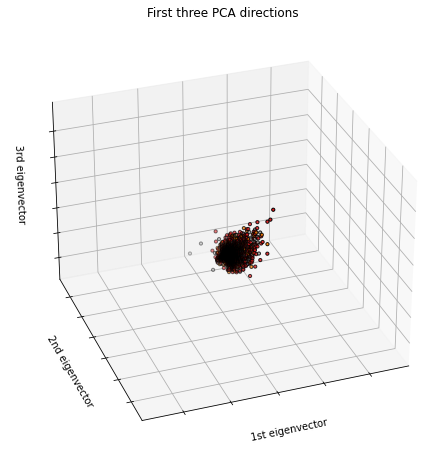

In [27]:
from pylab import rcParams
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)

ax.scatter(latent_vector[0],latent_vector[1],latent_vector[2], c=latent_vector["category"],
           cmap=plt.cm.Set1, edgecolor='k', s=10)

ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()